In [1]:
import torch
import torch.nn.functional as F
import torchvision.transforms.functional as TF
import lovely_tensors as lt
lt.monkey_patch()
from PIL import Image

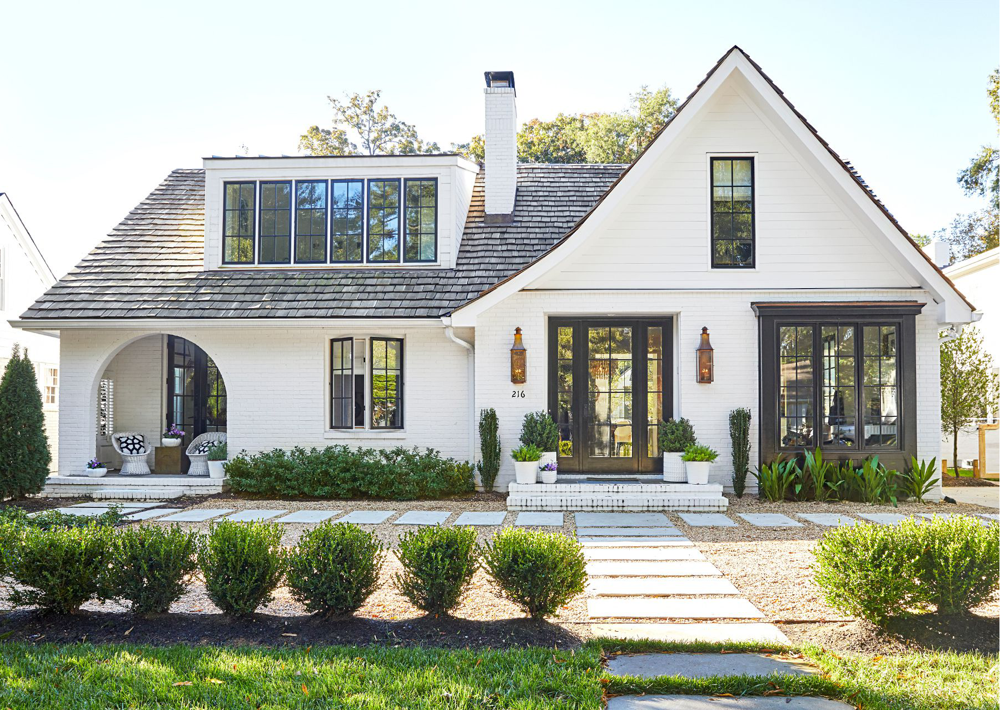

In [2]:
img = Image.open("house.jpeg")
img = TF.to_tensor(img)
img.rgb

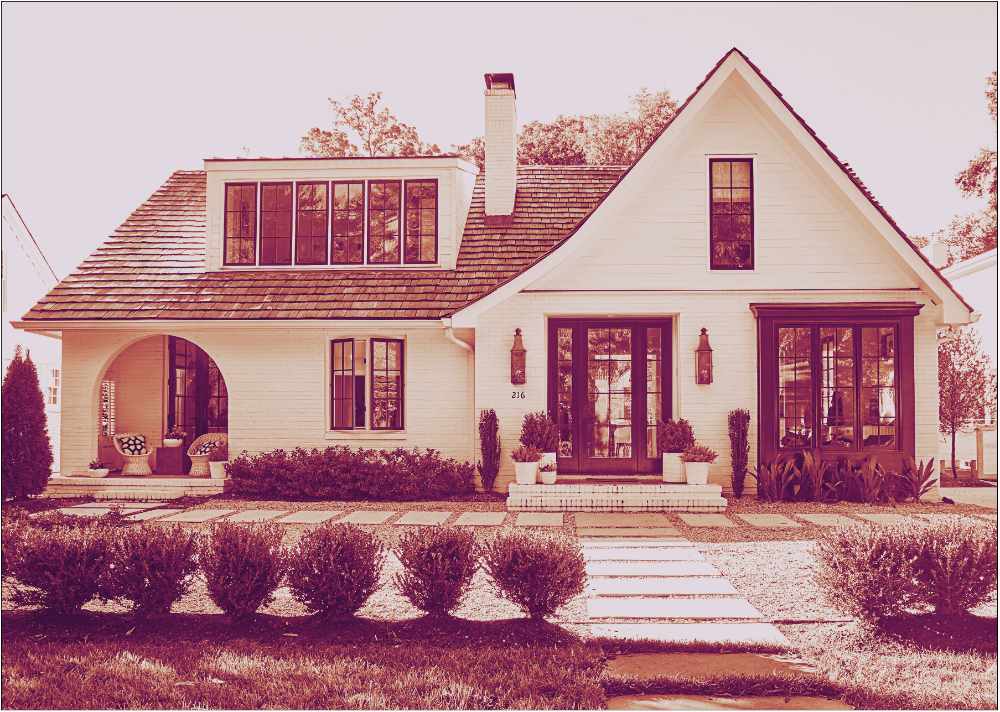

In [3]:
img = F.conv2d(
    input=img, 
    weight=torch.Tensor([0.2989, 0.5870, 0.1140]).view(1, 3, 1, 1),
    bias=torch.Tensor([0])
)
img.chans

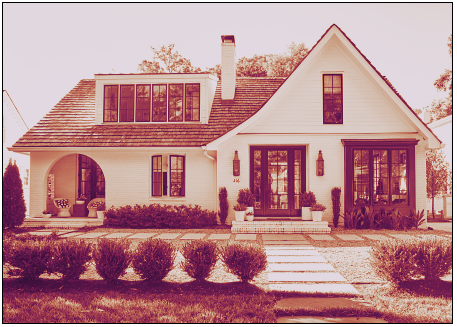

In [4]:
img = F.avg_pool2d(img, (4,4))
img.chans

In [5]:
def gaussian_kernel(size: int, sigma=1.0) -> torch.Tensor:
    coords = torch.arange(size) - (size - 1) / 2.0
    grid = torch.meshgrid(coords, coords, indexing='ij')
    kernel = torch.exp(-(grid[0]**2 + grid[1]**2) / (2 * sigma**2))
    return kernel / kernel.sum()

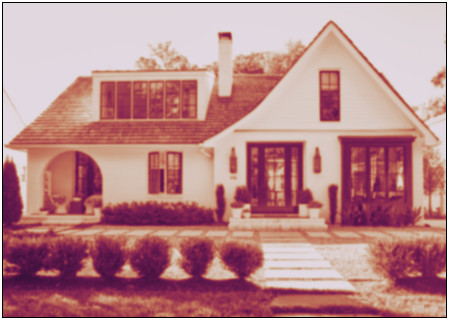

In [6]:
n = 7
img = F.conv2d(
    input=img, 
    weight=gaussian_kernel(n).view(1, 1, n, n),
    bias=torch.Tensor([0])
)
img.chans

In [7]:
sobel_x = torch.Tensor([
    [1,  0,  -1],
    [2,  0,  -2],
    [1,  0,  -1],
])

sobel_y = torch.Tensor([
    [ 1,  2,  1],
    [ 0,  0,  0],
    [-1, -2, -1],
])

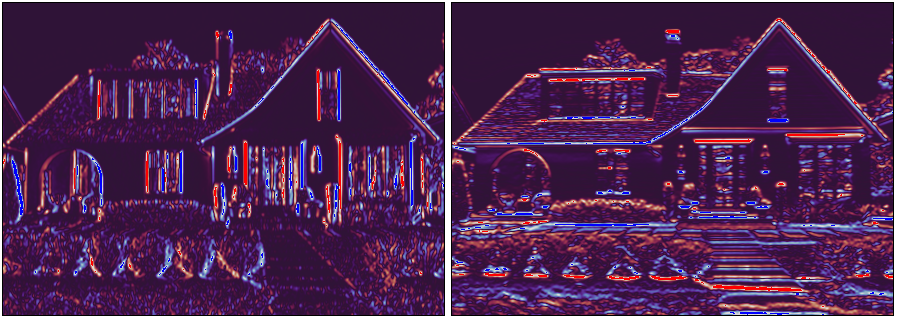

In [8]:
img = F.conv2d(
    input=img, 
    weight=torch.stack([sobel_x, sobel_y]).view(2, 1, 3, 3),
    bias=torch.Tensor([0, 0])
)
img.chans

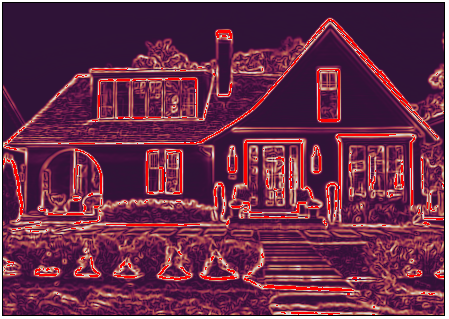

In [9]:
img_mag = torch.linalg.norm(img, dim=0)
img_mag.chans

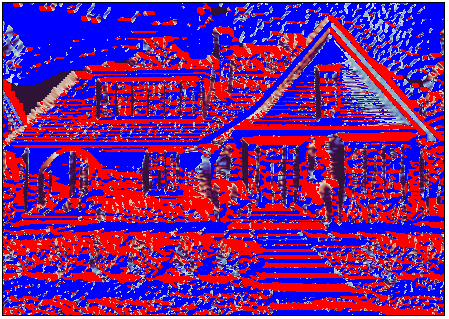

In [10]:
img_dir = torch.atan2(img[1], img[0])
img_dir.chans

In [11]:
def non_max_supression(mag, dir):
    PI = torch.pi
    nms = torch.zeros_like(mag)
    
    # Horizontal 
    mask = ((-PI/8 <= dir) & (dir < PI/8)) | (7*PI/8 <= dir) | (dir < -7*PI/8)
    condition_left = torch.roll(mag, shifts=-1, dims=1) * mask
    condition_right = torch.roll(mag, shifts=1, dims=1) * mask
    nms[mask] = mag[mask] * (mag > torch.max(condition_left, condition_right))[mask]

    # Diagonal (from top left to bottom right) 
    mask = (PI/8 <= dir) & (dir < 3*PI/8)
    condition_tl = torch.roll(torch.roll(mag, shifts=-1, dims=1), shifts=-1, dims=0) * mask
    condition_br = torch.roll(torch.roll(mag, shifts=1, dims=1), shifts=1, dims=0) * mask
    nms[mask] = mag[mask] * (mag > torch.max(condition_tl, condition_br))[mask]

    # Vertical
    mask = ((3*PI/8 <= dir) & (dir < 5*PI/8)) | (-5*PI/8 <= dir) & (dir < -3*PI/8)
    condition_up = torch.roll(mag, shifts=-1, dims=0) * mask
    condition_down = torch.roll(mag, shifts=1, dims=0) * mask
    nms[mask] = mag[mask] * (mag > torch.max(condition_up, condition_down))[mask]

    # Diagonal (from top right to bottom left)
    mask = (-3*PI/8 <= dir) & (dir < -PI/8)
    condition_tr = torch.roll(torch.roll(mag, shifts=1, dims=1), shifts=-1, dims=0) * mask
    condition_bl = torch.roll(torch.roll(mag, shifts=-1, dims=1), shifts=1, dims=0) * mask
    nms[mask] = mag[mask] * (mag > torch.max(condition_tr, condition_bl))[mask]

    return nms


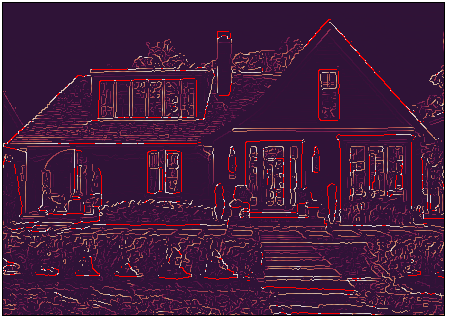

In [12]:
img = non_max_supression(img_mag, img_dir)
img.chans

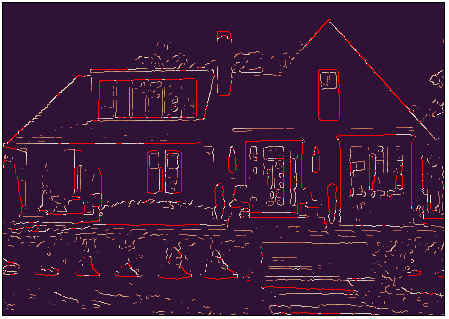

In [13]:
img = F.threshold(img, 0.5, 0)
img.chans

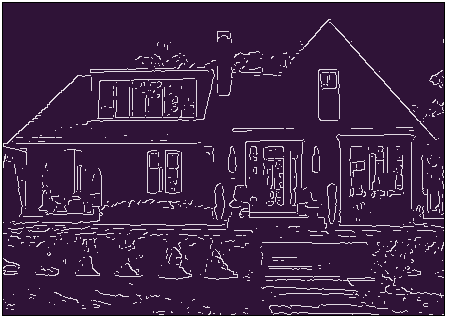

In [14]:
img = (img>1e-5).float()
img.chans

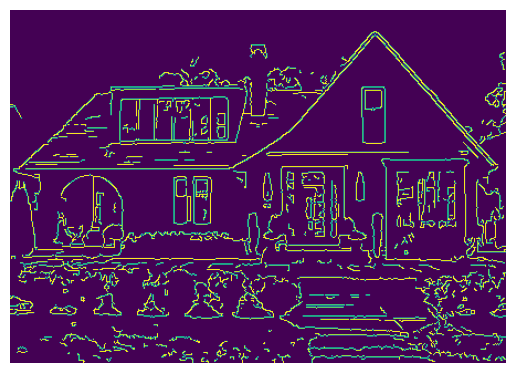

In [15]:
import cv2
import matplotlib.pyplot as plt

image = cv2.imread('house.jpeg', cv2.IMREAD_GRAYSCALE)
height, width = image.shape
image = cv2.resize(image, (width//4, height//4))
blurred = cv2.GaussianBlur(image, (7, 7), 1)
edges = cv2.Canny(blurred, 140, 200)

plt.imshow(edges)
plt.axis('off')
plt.show()
